In [10]:
from utils import data_loader
from utils import model

import numpy as np

from tqdm import tqdm
from skimage.io import imread
from skimage.transform import resize
from skimage.metrics import structural_similarity, peak_signal_noise_ratio

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from utils.heat_map import HeatMap
from utils.game_metrics import GAME_metric
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

2023-02-12 01:25:50.485608: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2023-02-12 01:25:50.485818: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-12 01:25:50.486094: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce RTX 2080 Ti computeCapability: 7.5
coreClock: 1.545GHz coreCount: 68 deviceMemorySize: 10.75GiB deviceMemoryBandwidth: 573.69GiB/s
2023-02-12 01:25:50.486139: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2023-02-12 01:25:50.486160: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.11
2023-02-12 01:25:50.486168: I tensorflow/stream_executor/plat

In [11]:
BATCH_SIZE = 1
BATCH_SAMPLE_SIZE = 64

dataset_dict = data_loader.load_dataset_paths(dataset_name='trancos_v3', validation_split_size=0.0, density_map_folder_name='density_maps_unspread')

test_input_data = dataset_dict['test']['images']
test_output_data = dataset_dict['test']['density_maps']

test_dataset, test_size = data_loader.load_dataset(
    input_paths=test_input_data,
    output_paths=test_output_data,
    output_type='density_maps',
    batch_size=BATCH_SIZE,
    shuffle=False,
    downsampling_size=2,
    buffer_size=1
)

In [12]:
test_size

421

In [13]:
model_pretrained = model.load_pretrained_model('./model_checkpoints/model_U-ASD-Net_MSE_BCE_Loss_Trancos_V3_unspread_checkpoint_02_11_2023_233752.h5')

In [14]:
estimation_pred = []
estimation_true = []
ssim_scores = []
psnr_scores = []
GAME_0 = []
GAME_1 = []
GAME_2 = []
GAME_3 = []

for _, data in tqdm(
        enumerate(test_dataset),
        total=len(test_dataset)
):
    dm_pred = np.squeeze(model_pretrained.predict(data[0])[0], axis=-1)
    dm_true = np.squeeze(data[1][0].numpy(), axis=-1)
    data_range=dm_pred.max() - dm_pred.min()

    GAME_0.append(GAME_metric(dm_true, dm_pred, 0))
    GAME_1.append(GAME_metric(dm_true, dm_pred, 1))
    GAME_2.append(GAME_metric(dm_true, dm_pred, 2))
    GAME_3.append(GAME_metric(dm_true, dm_pred, 3))
    ssim_scores.append(structural_similarity(dm_true, dm_pred, data_range=data_range))
    psnr_scores.append(peak_signal_noise_ratio(dm_true, dm_pred, data_range=data_range))
    estimation_true.append(np.sum(dm_true))
    estimation_pred.append(np.sum(dm_pred))

100%|██████████| 421/421 [00:19<00:00, 21.31it/s]


In [15]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
mse = mean_squared_error(estimation_true, estimation_pred)
mae = mean_absolute_error(estimation_true, estimation_pred)
game0 = np.mean(GAME_0)
game1 = np.mean(GAME_1)
game2 = np.mean(GAME_2)
game3 = np.mean(GAME_3)

print('GAME 0:{} GAME 1:{} GAME 2:{} GAME 3:{} '.format(game0, game1, game2, game3))
print('Mean Absolute Error: {}'.format(mae))
print('Mean Square Error: {}'.format(mse))
print('SSIM: {}'.format(np.average(ssim_scores)))
print('PSNR: {}'.format(np.average(psnr_scores)))

GAME 0:13.980451583862305 GAME 1:16.617555819477435 GAME 2:20.522779097387172 GAME 3:24.976266033254156 
Mean Absolute Error: 13.980457305908203
Mean Square Error: 302.7483825683594
SSIM: 0.6090887754144355
PSNR: 16.842655980670873


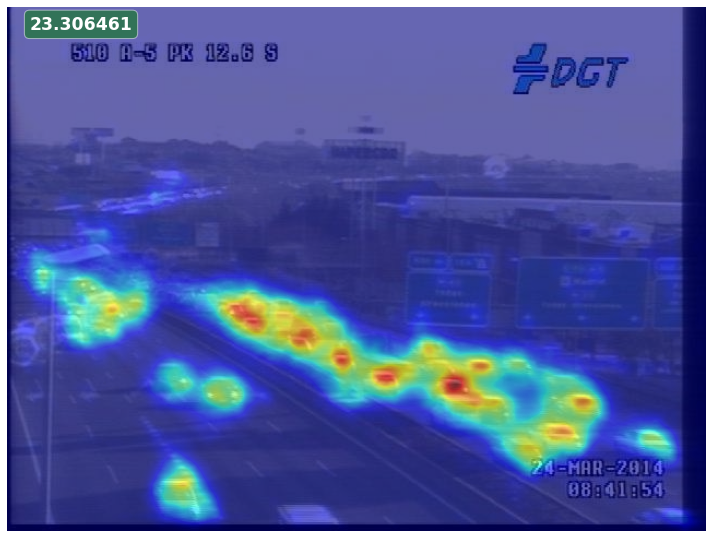

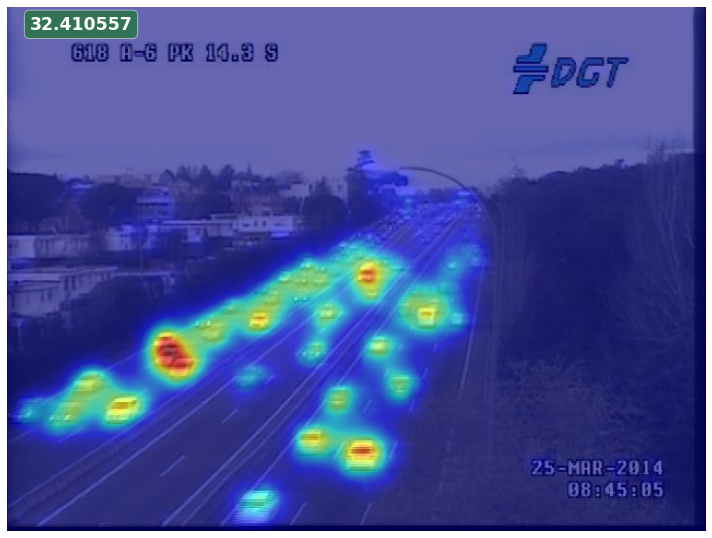

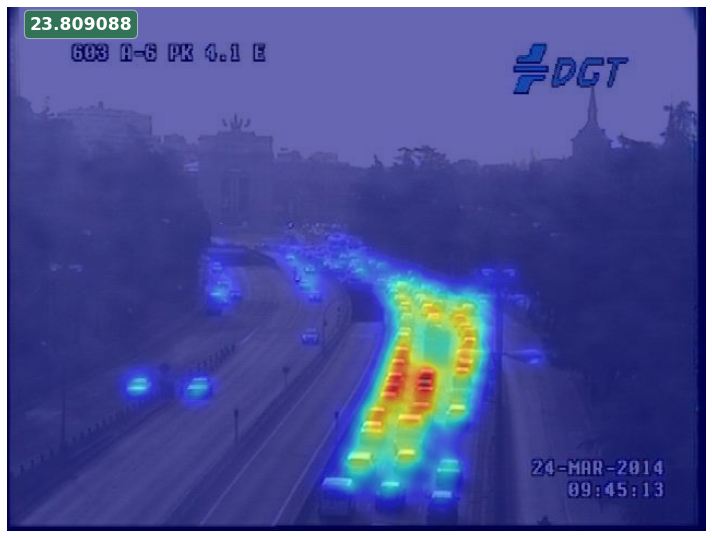

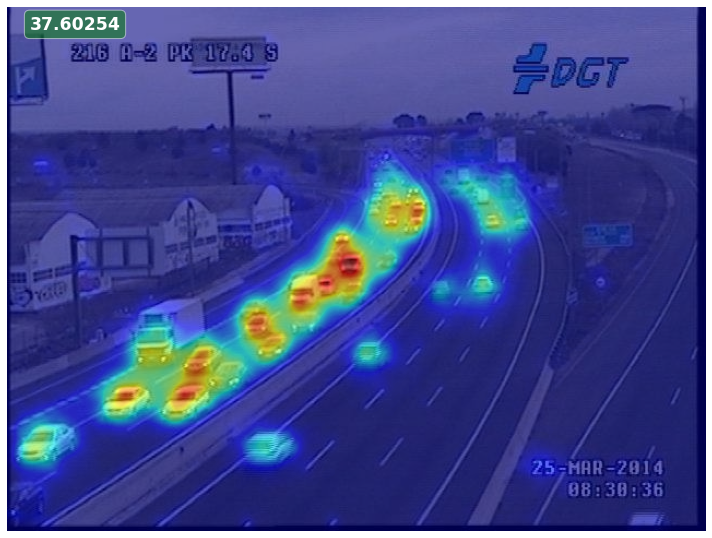

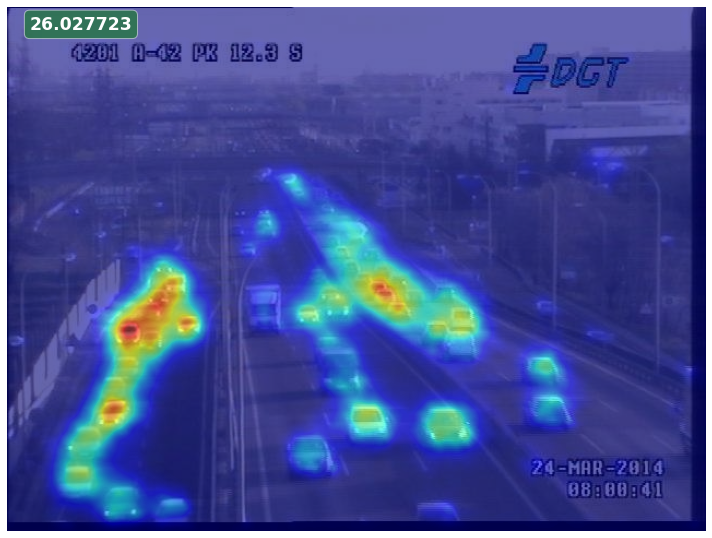

...

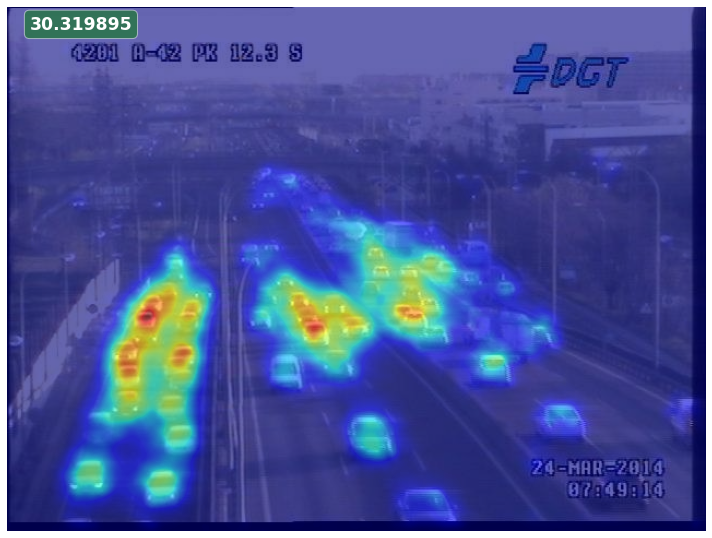

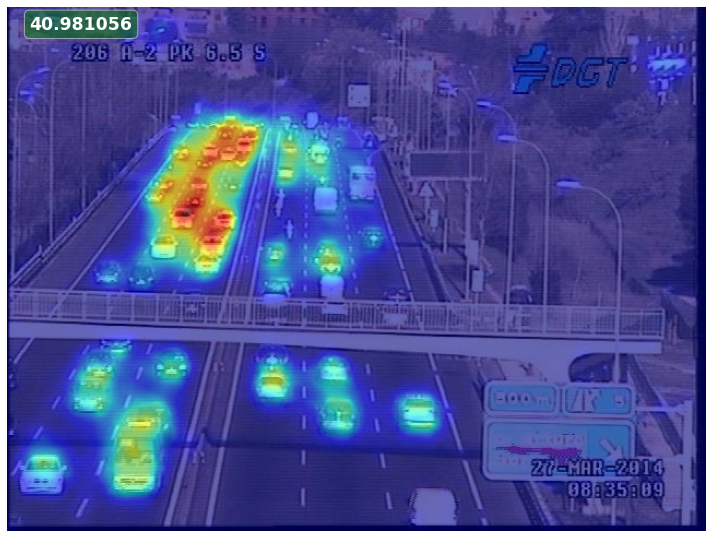

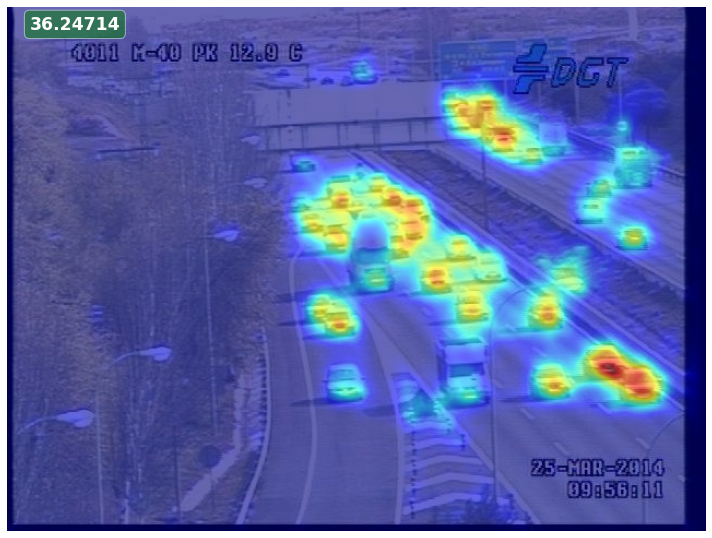

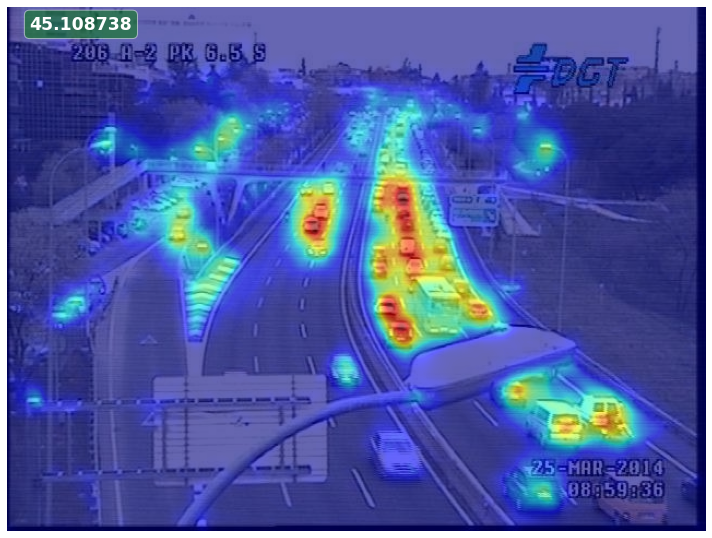

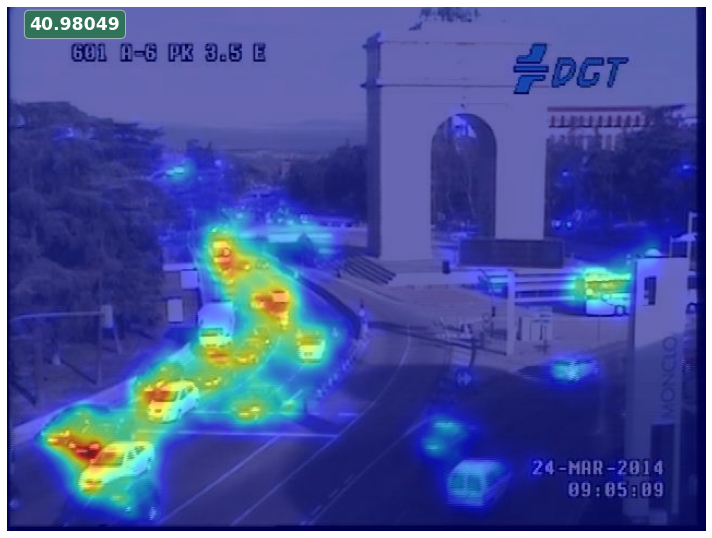

In [16]:
for image, density_map in test_dataset.take(20):
    img_plot = image.numpy()
    img_plot = (img_plot * 255).astype(np.uint8)

    pred_density_map = model_pretrained.predict(image)

    estimation = np.sum(pred_density_map)
    hm = HeatMap(img_plot[0] , pred_density_map[0], gaussian_std=3)
    hm.plot(transparency=0.6, color_map='jet', text=str(estimation))